# Exaploratory Analysis for Woolf's Odyssey

### [—————————————pipeline—————————————]
### »——raw—»—clean—»—normalize—»—dataframe——»—EDA—»


I'm taking the csv from the dataframer step into a Pandas dataframe.

## Flow:

* Libraries, directories and text
* Distribution of Lexical Features
* Custom and Customizable Tokenizer Pipeline
* Most Frequent and Keywords
    - counter
    - df_freqs wordclouds
    - Keyword Window
    - Lineplots
    - Heatmaps
    - IDF df &  wordclouds
* Bigrams

## Libraries, directories and text

In [1]:
import numpy as np
import pandas as pd

from tqdm.notebook import tqdm
import re
tqdm.pandas()

import re
import nltk

import os

In [2]:
import sys
sys.path.append('/Users/debr/English-Homer') 
import matplotlib.pyplot as plt
import seaborn as sns
import bard_visualization as viz# This will apply the visualization settings

Bard viz is on the stage!


In [4]:
# TO UPDATE
translator = "Woolf"

# Paths
filepath = f"/Users/debr/odysseys_en/dataframed/Odyssey_Woolf_DataFrame.csv"
output_path_plots = f"/Users/debr/English-Homer/EDA_by_Author/{translator}_EDA/plots/"
os.makedirs(os.path.dirname(output_path_plots), exist_ok=True)

# Load
df = pd.read_csv(filepath)
df['text'][0]

"['As the streets that lead from the Strand to the Embankment are very\\n', 'narrow, it is better not to walk down them arm-in-arm. If you persist,\\n', 'lawyers’ clerks will have to make flying leaps into the mud; young lady\\n', 'typists will have to fidget behind you. In the streets of London where\\n', 'beauty goes unregarded, eccentricity must pay the penalty, and it is\\n', 'better not to be very tall, to wear a long blue cloak, or to beat the\\n', 'air with your left hand.\\n', 'One afternoon in the beginning of October when the traffic was becoming\\n', 'brisk a tall man strode along the edge of the pavement with a lady on\\n', 'his arm. Angry glances struck upon their backs. The small, agitated\\n', 'figures—for in comparison with this couple most people looked\\n', 'small—decorated with fountain pens, and burdened with despatch-boxes,\\n', 'had appointments to keep, and drew a weekly salary, so that there was\\n', 'some reason for the unfriendly stare which was bestowed upon 

In [5]:
def remove_linebreak(text):
    """
    Removes all line breaks ('\n') from text or list of strings.
    """
    text = re.sub(r'\\n', ' ', text)
    text = re.sub(r"\'", ' ', text)
    text = re.sub(r"\[", ' ', text)
    return text.strip()
    
# Remove line breaks from the 'text' column
df['text'] = df['text'].progress_apply(remove_linebreak)
df['text'][0]

  0%|          | 0/24 [00:00<?, ?it/s]

'As the streets that lead from the Strand to the Embankment are very  ,  narrow, it is better not to walk down them arm-in-arm. If you persist,  ,  lawyers’ clerks will have to make flying leaps into the mud; young lady  ,  typists will have to fidget behind you. In the streets of London where  ,  beauty goes unregarded, eccentricity must pay the penalty, and it is  ,  better not to be very tall, to wear a long blue cloak, or to beat the  ,  air with your left hand.  ,  One afternoon in the beginning of October when the traffic was becoming  ,  brisk a tall man strode along the edge of the pavement with a lady on  ,  his arm. Angry glances struck upon their backs. The small, agitated  ,  figures—for in comparison with this couple most people looked  ,  small—decorated with fountain pens, and burdened with despatch-boxes,  ,  had appointments to keep, and drew a weekly salary, so that there was  ,  some reason for the unfriendly stare which was bestowed upon Mr.  ,  Ambrose’s height and

## Distribution of Lexical Features

To understand the structural composition of The Odyssey, let's analyze the distribution of the blocks of the text: words, lines, sentences.

**Stacked Line Plot – Spread of Features Across Books**
* A stacked visualization of words, sentences, and lines across books provides a clear view of how these features vary throughout the text.
* This helps identify trends in narrative structure, such as sections with higher density of words or shorter sentences, which may indicate shifts in tone or pacing.

**Kernel Density Approximation (KDA) – Probability Distribution**
* KDA estimates the probability density function (PDF) of lexical features, condensing their distribution into a single plot.
	- Highlights anomalies (e.g., sections with extreme sentence or word counts).
	- Shows overlapping distributions, revealing relationships between words, sentences, and lines.
	- Helps smooth out discrete data for better visualization of trends.

The stacked line plot provides a book-by-book breakdown, useful for seeing structural variation over the narrative. The KDA plot gives a global view of feature distributions, helping identify outliers and stylistic patterns.    

In [6]:
# Fit features to the same scale

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df[['scaled_num_words', 'scaled_num_sentences', 'scaled_num_lines']] = scaler.fit_transform(df[['num_words', 'num_sentences', 'num_lines']])

/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert in

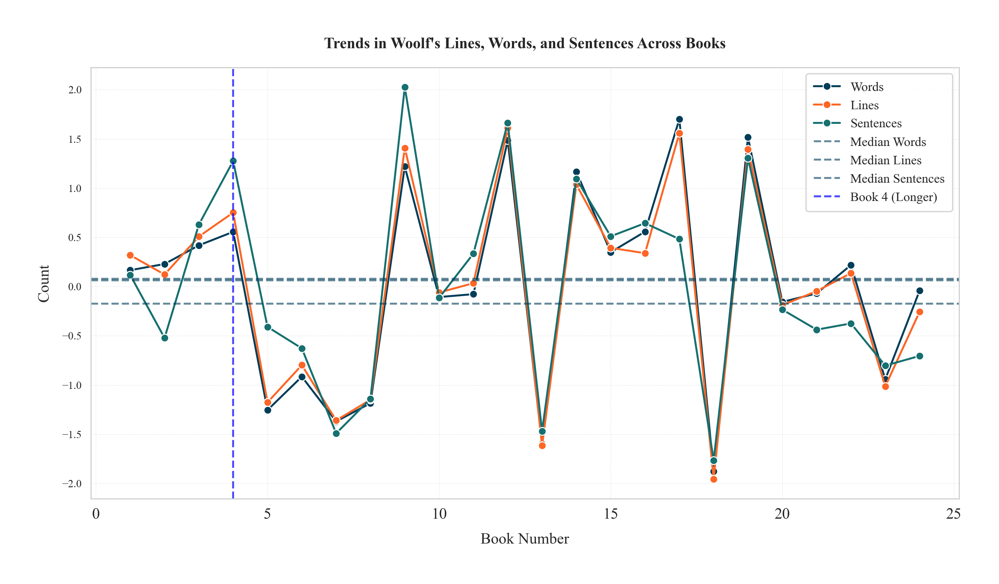

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))

# Plot lines, words, and sentences across books
sns.lineplot(x=df["book_num"], y=df["scaled_num_words"], label="Words", marker="o") #, color="#fcc921"
sns.lineplot(x=df["book_num"], y=df["scaled_num_lines"], label="Lines", marker="o") #, color="#86C3BC"
sns.lineplot(x=df["book_num"], y=df["scaled_num_sentences"], label="Sentences", marker="o") #, color="#FD6626"

# Compute medians
median_words = df["scaled_num_words"].median()
median_lines = df["scaled_num_lines"].median()
median_sentences = df["scaled_num_sentences"].median()

# Add horizontal median lines
plt.axhline(y=median_words, linestyle="--", alpha=0.6, label="Median Words")
plt.axhline(y=median_lines, linestyle="--", alpha=0.6, label="Median Lines")
plt.axhline(y=median_sentences, linestyle="--", alpha=0.6, label="Median Sentences")

# Highlight Book 4
plt.axvline(x=4, color='blue', linestyle='--', alpha=0.7, label="Book 4 (Longer)")

# Labels and legend
plt.xlabel("Book Number")
plt.ylabel("Count")
plt.title(f"Trends in {translator}'s Lines, Words, and Sentences Across Books")
plt.legend()
plt.grid(alpha=0.3)
plt.savefig(f"{output_path_plots}/{translator}-Trends_Lines_Words_Sentences.png")
plt.show()

/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/debr/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


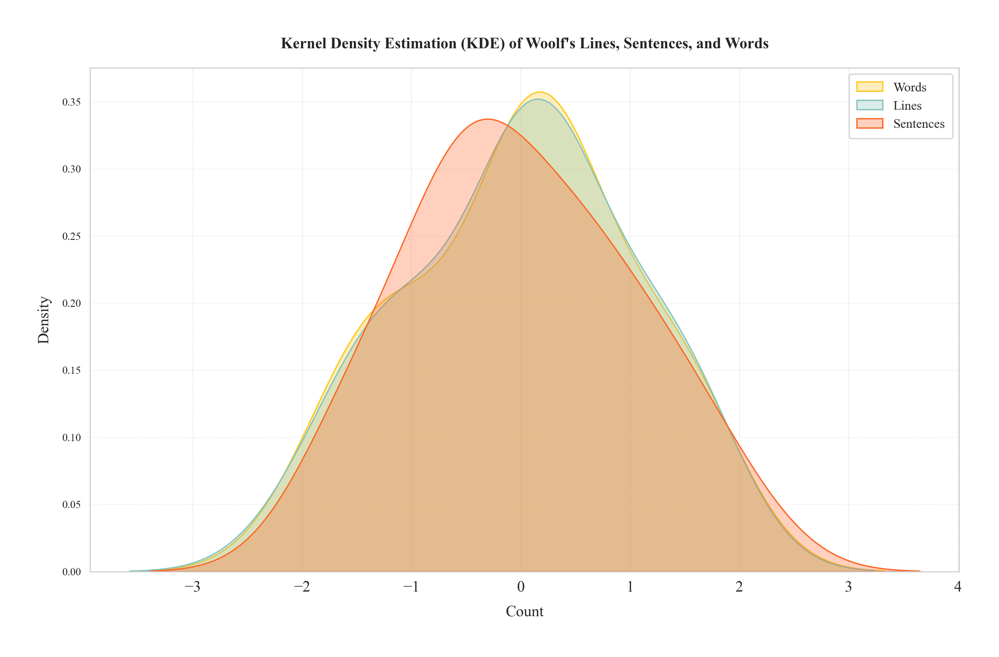

In [8]:
# KDE plot for Lines, Sentences, and Words
sns.kdeplot(df['scaled_num_words'], label="Words", color= "#fcc921", fill=True, alpha=0.3)
sns.kdeplot(df['scaled_num_lines'], label="Lines", color='#86C3BC', fill=True, alpha=0.3)
sns.kdeplot(df['scaled_num_sentences'], label="Sentences", color='#FD6626',fill=True, alpha=0.3)

plt.xlabel("Count")
plt.ylabel("Density")
plt.title(f"Kernel Density Estimation (KDE) of {translator}'s Lines, Sentences, and Words")
plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.savefig(f"{output_path_plots}/{translator}-KDE_Lines_Sentences_Words.png")
plt.show()

**Interpretation:**

The general trend, and expectation, is that words and lines follow each other distribution, while there is some variation in sentence lenght. This is to be expected because words and lines are more constrained than sentences, which vary depending on narrative function (dialog, action, formulaic verse, etc) and style. 

The scatter plot bellow give another perspective of the distribution whille highlighting the distance of Book Fourth from the rest. and the boxplots show outliers individualy, if any.

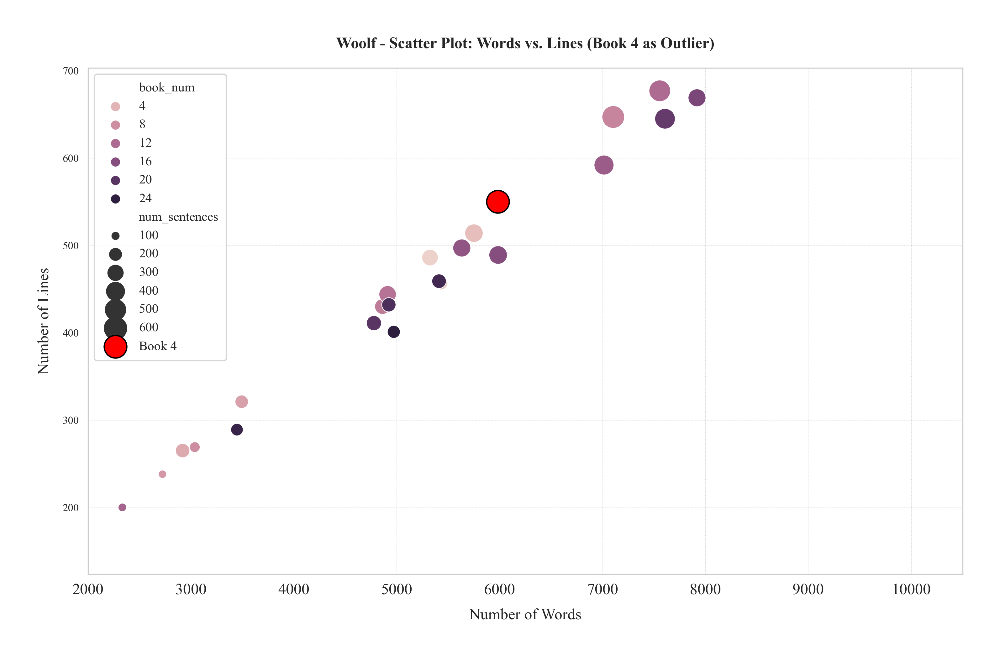

In [9]:
sns.scatterplot(data=df, x="num_words", y="num_lines", 
                hue="book_num", size="num_sentences", sizes=(20, 300))
# Highlight Book 4
plt.scatter(df[df["book_num"] == 4]["num_words"], 
            df[df["book_num"] == 4]["num_lines"], 
            color="red", s=300, label="Book 4", edgecolors="black")

plt.xlabel("Number of Words")
plt.ylabel("Number of Lines")
plt.title(f"{translator} - Scatter Plot: Words vs. Lines (Book 4 as Outlier)")
plt.legend(loc="upper left")
plt.grid(alpha=0.3)
plt.xlim(2000, 10500) # same range as Wilson's plot
plt.savefig(f"{output_path_plots}/{translator}-Scatter_Words_Lines.png")
plt.show()

Lattimore's Book 4 is the longest so far.

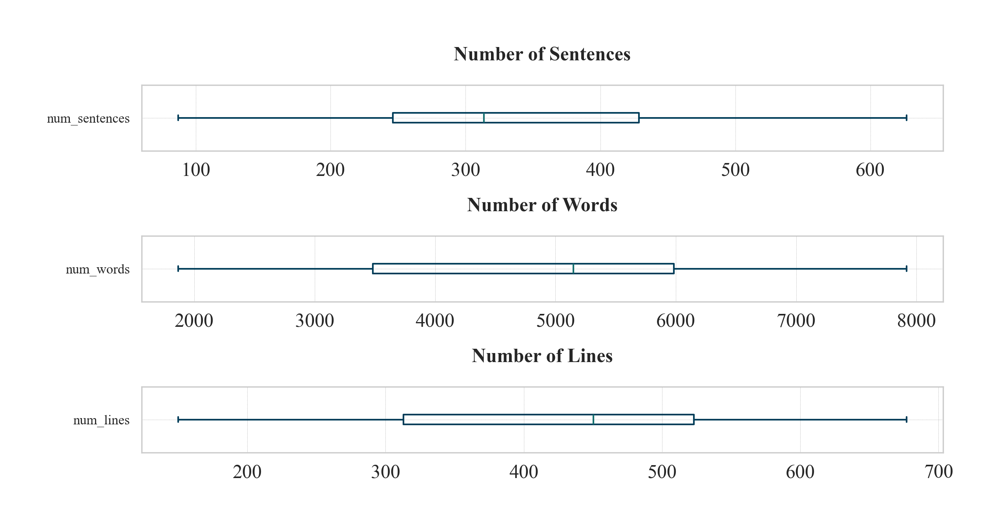

In [10]:
# Create a figure with 3 subplots (one for each variable)
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(8, 4), sharex=False)

# Plot boxplots
df['num_sentences'].plot(kind='box', vert=False, ax=axes[0])
axes[0].set_title("Number of Sentences")
df['num_words'].plot(kind='box', vert=False, ax=axes[1])
axes[1].set_title("Number of Words")
df['num_lines'].plot(kind='box', vert=False, ax=axes[2])
axes[2].set_title("Number of Lines")
plt.tight_layout()
plt.savefig(f"{output_path_plots}/{translator}-Boxplots_Sentences_Words_Lines.png") 
plt.show()

## Custom and Customizable Tokenizer Pipeline

In [16]:
# NLTK Pipeline for Tokenizing Text
# Includes lowercasing, tokenization, and stopword removal
# Customizable stopwords with inclusions and exclusions

import string
from typing import List, Callable, Union, Set, Optional

# Download necessary NLTK resources
print("Downloading NLTK resources...")
nltk.download('punkt_tab')
nltk.download('punkt', quiet=True)
nltk.download('stopwords', quiet=True)
print("Download complete.")

##############################################
# NLPPipeline Class
##############################################
class NLPPipeline:
    """
    A configurable NLP pipeline for linguistic text analysis.
    
    This class provides methods for text preprocessing, including:
    - Lowercasing
    - Tokenization using NLTK's word_tokenize
    - Punctuation removal with customizable punctuation sets
    - Stopword removal with customizable stopword lists
    """
    
    def __init__(self, language: str = 'english'):
        """
        Initialize the NLP pipeline.
        
        Args:
            language (str): Language for stopwords (default: 'english')
        """
        self.language = language
        self.stopwords = set(nltk.corpus.stopwords.words(language))
        self.custom_include_stopwords: Set[str] = set()
        self.custom_exclude_stopwords: Set[str] = set()
        self.update_stopwords()
        
        # Initialize punctuation set with string.punctuation
        self.default_punctuation = set(string.punctuation)
        self.keep_punctuation: Set[str] = set()
        self.punctuation_to_remove: Set[str] = set()
        self.update_punctuation()
    
    def update_stopwords(self) -> None:
        """
        Update the stopwords set based on custom inclusions and exclusions.
        """
        self.effective_stopwords = self.stopwords.copy()
        self.effective_stopwords |= self.custom_include_stopwords
        self.effective_stopwords -= self.custom_exclude_stopwords
    
    def update_punctuation(self) -> None:
        """
        Update the punctuation set based on custom inclusions and exclusions.
        """
        self.effective_punctuation = self.default_punctuation.copy()
        self.effective_punctuation -= self.keep_punctuation
        self.effective_punctuation |= self.punctuation_to_remove
    
    def customize_stopwords(self, include: Optional[Set[str]] = None, 
                           exclude: Optional[Set[str]] = None) -> None:
        """
        Customize the stopwords by including or excluding specific words.
        
        Args:
            include (Set[str], optional): Words to add to stopwords
            exclude (Set[str], optional): Words to remove from stopwords
        """
        if include:
            self.custom_include_stopwords |= include
        if exclude:
            self.custom_exclude_stopwords |= exclude
        self.update_stopwords()
        
        # Print summary of changes
        print(f"Stopwords customized:")
        if include:
            print(f"  Added: {include}")
        if exclude:
            print(f"  Removed: {exclude}")
        print(f"  Total stopwords: {len(self.effective_stopwords)}")
    
    def customize_punctuation(self, keep: Optional[Set[str]] = None,
                             remove: Optional[Set[str]] = None) -> None:
        """
        Customize the punctuation handling by specifying characters to keep or remove.
        
        Args:
            keep (Set[str], optional): Punctuation characters to keep
            remove (Set[str], optional): Additional characters to remove
        """
        if keep:
            self.keep_punctuation |= keep
        if remove:
            self.punctuation_to_remove |= remove
        self.update_punctuation()
        
        # Print summary of changes
        print(f"Punctuation customized:")
        if keep:
            print(f"  Keeping: {keep}")
        if remove:
            print(f"  Additional removals: {remove}")
        print(f"  Punctuation to be removed: {''.join(sorted(self.effective_punctuation))}")
    
    def lowercase(self, text: str) -> str:
        """
        Convert text to lowercase.
        
        Args:
            text (str): Input text
            
        Returns:
            str: Lowercase text
        """
        if not isinstance(text, str):
            return ""
        return text.lower()
    
    def tokenize(self, text: str) -> List[str]:
        """
        Tokenize text using NLTK's word_tokenize.
        
        Args:
            text (str): Input text
            
        Returns:
            List[str]: List of tokens
        """
        if not isinstance(text, str):
            return []
        text = text.replace("—", " ").replace("–", " ")
        return nltk.tokenize.word_tokenize(text)
    
    def remove_punctuation(self, tokens: List[str]) -> List[str]:
        """
        Remove punctuation from tokens or filter out punctuation-only tokens.
        
        Args:
            tokens (List[str]): List of tokens
            
        Returns:
            List[str]: Tokens with punctuation removed
        """
        # Create a translation table for punctuation removal
        punct_table = str.maketrans('', '', ''.join(self.effective_punctuation))
        
        # Apply translation to each token and filter out empty tokens
        cleaned_tokens = []
        for token in tokens:
            cleaned = token.translate(punct_table)
            if cleaned:  # Only add non-empty tokens
                cleaned_tokens.append(cleaned)
        
        return cleaned_tokens
    
    def remove_stopwords(self, tokens: List[str]) -> List[str]:
        """
        Remove stopwords from the list of tokens.
        
        Args:
            tokens (List[str]): List of tokens
            
        Returns:
            List[str]: Filtered list without stopwords
        """
        return [t for t in tokens if t.lower() not in self.effective_stopwords]
    
    def get_pipeline(self, lowercase: bool = True, 
                    tokenize: bool = True,
                    remove_punctuation: bool = True,
                    remove_stops: bool = True) -> List[Callable]:
        """
        Get a customized processing pipeline.
        
        Args:
            lowercase (bool): Include lowercasing step
            tokenize (bool): Include tokenization step
            remove_punctuation (bool): Include punctuation removal step
            remove_stops (bool): Include stopword removal step
            
        Returns:
            List[Callable]: List of processing functions
        """
        pipeline = []
        if lowercase:
            pipeline.append(self.lowercase)
        if tokenize:
            pipeline.append(self.tokenize)
        if remove_punctuation:
            pipeline.append(self.remove_punctuation)
        if remove_stops:
            pipeline.append(self.remove_stopwords)
        return pipeline
    
    def process_text(self, text: str, pipeline: Optional[List[Callable]] = None) -> Union[str, List[str]]:
        """
        Process a single text through the pipeline.
        
        Args:
            text (str): Text to process
            pipeline (List[Callable], optional): Custom pipeline to use
            
        Returns:
            Union[str, List[str]]: Processed text or tokens
        """
        if pipeline is None:
            pipeline = self.get_pipeline()
        
        result = text
        for transform in pipeline:
            try:
                result = transform(result)
            except Exception as e:
                print(f"Error applying {transform.__name__}: {e}")
        return result
    
    def process_series(self, series: pd.Series, pipeline: Optional[List[Callable]] = None) -> pd.Series:
        """
        Process a pandas Series of texts through the pipeline with progress bar.
        
        Args:
            series (pd.Series): Series containing texts
            pipeline (List[Callable], optional): Custom pipeline to use
            
        Returns:
            pd.Series: Series with processed texts/tokens
        """
        if pipeline is None:
            pipeline = self.get_pipeline()
        
        tqdm.pandas(desc="Processing texts")
        return series.progress_apply(lambda x: self.process_text(x, pipeline))
    
    def process_dataframe(self, df: pd.DataFrame, text_column: str, 
                         result_column: str, pipeline: Optional[List[Callable]] = None) -> pd.DataFrame:
        """
        Process a dataframe by applying the pipeline to a text column.
        
        Args:
            df (pd.DataFrame): Input dataframe
            text_column (str): Column containing texts to process
            result_column (str): Column name for storing processed results
            pipeline (List[Callable], optional): Custom pipeline to use
            
        Returns:
            pd.DataFrame: Processed dataframe
        """
        if text_column not in df.columns:
            raise ValueError(f"Column '{text_column}' not found in dataframe")
        
        result_df = df.copy()
        result_df[result_column] = self.process_series(df[text_column], pipeline)
        return result_df
##################################################
# End of NLPPipeline Class
##################################################
# Initialize the pipeline
nlp = NLPPipeline(language='english')

# Customize stopwords
nlp.customize_stopwords(
    include={'one', 'two', 'three', 'four', 'five', 'six', 'seven', 'eight', 'nine', 'ten',
             "'", 'n', "'and","mrs", "mr", "said", "that", "he", "she", "it", "they", "them",
             "this", "there", "is", "was", "are", "were", "be", "been", "being", "upon", "of",},
    exclude={''}
)
# Customize punctuation
nlp.customize_punctuation(
    keep={'-', ""},  # Keep hyphens and apostrophes
    remove={r'…', '—','”','’','“', '‘', '-', '\\'}  # Additional characters to remove
)

# Process with default pipeline (lowercase -> tokenize -> remove punctuation -> remove stopwords)
df = nlp.process_dataframe(df, 'text', 'tokens')

Download complete.
Stopwords customized:
  Added: {'five', 'been', 'upon', 'she', 'be', 'mr', 'seven', 'he', 'three', 'were', 'being', 'them', 'said', "'", 'six', 'two', 'four', 'that', 'one', 'they', 'there', 'of', "'and", 'are', 'this', 'is', 'was', 'eight', 'nine', 'n', 'mrs', 'ten', 'it'}
  Removed: {''}
  Total stopwords: 215
Punctuation customized:
  Keeping: {'-', ''}
  Additional removals: {'-', '‘', '’', '—', '“', '\\', '”', '…'}
  Punctuation to be removed: !"#$%&'()*+,-./:;<=>?@[\]^_`{|}~—‘’“”…


[nltk_data] Downloading package punkt_tab to /Users/debr/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

In [17]:
df['text'][0]

'As the streets that lead from the Strand to the Embankment are very  ,  narrow, it is better not to walk down them arm-in-arm. If you persist,  ,  lawyers’ clerks will have to make flying leaps into the mud; young lady  ,  typists will have to fidget behind you. In the streets of London where  ,  beauty goes unregarded, eccentricity must pay the penalty, and it is  ,  better not to be very tall, to wear a long blue cloak, or to beat the  ,  air with your left hand.  ,  One afternoon in the beginning of October when the traffic was becoming  ,  brisk a tall man strode along the edge of the pavement with a lady on  ,  his arm. Angry glances struck upon their backs. The small, agitated  ,  figures—for in comparison with this couple most people looked  ,  small—decorated with fountain pens, and burdened with despatch-boxes,  ,  had appointments to keep, and drew a weekly salary, so that there was  ,  some reason for the unfriendly stare which was bestowed upon Mr.  ,  Ambrose’s height and

In [18]:
df['num_tokens'] = df['tokens'].map(len)

## Most Frequent and Keywords

In [19]:
from collections import Counter
counter = Counter()
df['tokens'].map(counter.update)
keywords = [word for word, count in counter.most_common(10)]
keywords_count = counter.most_common(10)
print(keywords)
print(keywords_count)

['rachel', 'like', 'helen', 'people', 'would', 'could', 'hewet', 'hirst', 'things', 'little']
[('rachel', 522), ('like', 366), ('helen', 351), ('people', 333), ('would', 294), ('could', 293), ('hewet', 232), ('hirst', 232), ('things', 230), ('little', 217)]


In [20]:
keywords_count = counter.most_common(100)
print(keywords_count)

[('rachel', 522), ('like', 366), ('helen', 351), ('people', 333), ('would', 294), ('could', 293), ('hewet', 232), ('hirst', 232), ('things', 230), ('little', 217), ('looked', 200), ('time', 195), ('think', 194), ('great', 191), ('say', 183), ('see', 182), ('life', 176), ('seemed', 173), ('never', 173), ('made', 169), ('know', 168), ('women', 167), ('eyes', 163), ('old', 162), ('much', 153), ('went', 153), ('man', 152), ('world', 144), ('way', 143), ('always', 140), ('though', 139), ('asked', 139), ('men', 138), ('go', 137), ('miss', 137), ('came', 136), ('back', 134), ('still', 131), ('look', 130), ('round', 127), ('room', 124), ('thought', 123), ('come', 122), ('well', 119), ('woman', 118), ('terence', 117), ('young', 116), ('really', 115), ('might', 114), ('looking', 113), ('good', 113), ('flushing', 113), ('talk', 110), ('began', 110), ('love', 108), ('sat', 108), ('something', 108), ('must', 105), ('face', 105), ('mind', 105), ('ever', 104), ('thing', 103), ('going', 103), ('day', 

Those most frequent tokens are exactly what one would expect from an Odyssey translation. What it is impressive, more if we consider modern interpretations (since 1500), the omission of mother and Penelope in the first 30 most frequent words. 

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

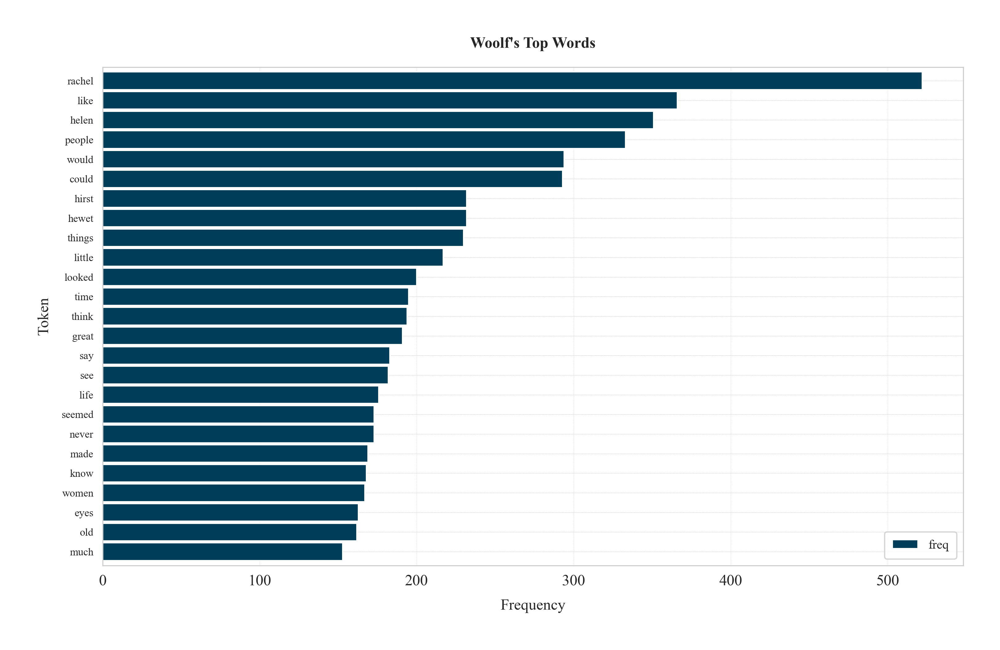

In [21]:
# From Blueprints for Text Analysis Using Python
# By Matthew Russell
from collections import Counter ###
def count_words(df, column='tokens', preprocess=None, min_freq=2):

    # process tokens and update counter
    def update(doc): 
        tokens = doc if preprocess is None else preprocess(doc)
        counter.update(tokens) # 

    # create counter and run through all data
    counter = Counter()
    df[column].progress_map(update)

    # transform counter into data frame
    df = pd.DataFrame.from_dict(counter, orient='index', columns=['freq'])
    df = df.query('freq >= @min_freq')
    df.index.name = 'token'

    return df.sort_values('freq', ascending=False)

# New df with word frequencies
df_freqs = count_words(df)

# Plot the top 25 words
ax = df_freqs.head(25).plot(kind='barh', width=0.9)
ax.invert_yaxis()
ax.set(xlabel='Frequency', ylabel='Token', title=f"{translator}'s Top Words")
plt.grid(axis='x', alpha=0.3)
plt.savefig(f"/Users/debr/English-Homer/EDA_by_Author/{translator}_EDA/plots/{translator}-Top_Words.png")
plt.show()

In [22]:
df_freqs.shape

(4768, 1)

On that visualization alone we can observe that Fagles is **top word is not one but the duo Odysseus/man**; this alternating feature is not present in Green and Wilson's translations, which for both is Odysseus. My intuition tells me that **Fagles is also departing from the Zip's Law** expected distance between top used words.

### Wordcloud of Most Frequent

(-0.5, 399.5, 199.5, -0.5)

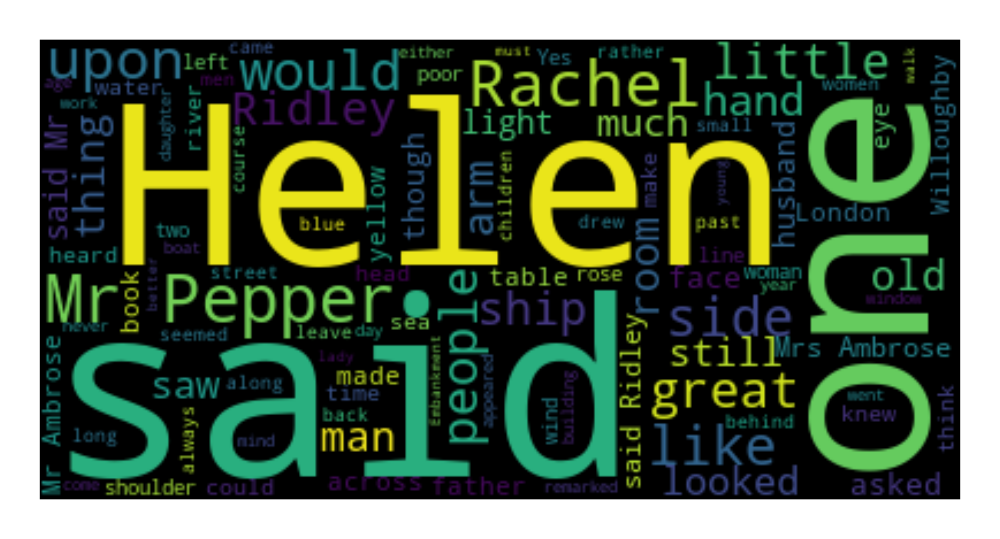

In [23]:
from wordcloud import WordCloud
from matplotlib import pyplot as plt

text = df.query("book_num==1")['text'].values[0]
stopwords = set(nltk.corpus.stopwords.words('english'))
plt.figure(figsize=(12, 7)) ###
wc = WordCloud(max_words=100, stopwords=stopwords)
wc.generate(text)
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")

Processing texts:   0%|          | 0/1 [00:00<?, ?it/s]

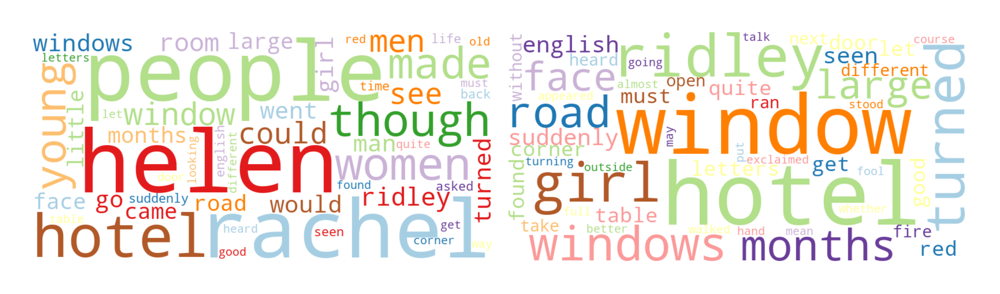

In [24]:
from wordcloud import WordCloud ###
from collections import Counter ###

def wordcloud(word_freq, title=None, max_words=200, stopwords=None):

    wc = WordCloud(width=800, height=400,
                   background_color= 'white', colormap="Paired",
                   max_font_size=150, max_words=max_words)

    # convert data frame into dict
    if type(word_freq) == pd.Series:
        counter = Counter(word_freq.fillna(0).to_dict())
    else:
        counter = word_freq

    # filter stop words in frequency counter
    if stopwords is not None:
        counter = {token:freq for (token, freq) in counter.items()
                              if token not in stopwords}
    wc.generate_from_frequencies(counter)

    plt.title(title)

    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")

df_wc = count_words(df[df['book_num']==8]) 
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)###
wordcloud(df_wc['freq'], max_words=50)
plt.subplot(1,2,2)###
wordcloud(df_wc['freq'], max_words=50, stopwords=df_freqs.head(50).index) # Prunning the top 50 words
plt.tight_layout()###

### Keywords to DataFrame

In [25]:
def count_keywords(tokens, keywords):
    tokens = [t for t in tokens if t in keywords]
    counter = Counter(tokens)
    return [counter.get(k, 0) for k in keywords]

def count_keywords_by(df, by, keywords, column='tokens'):

    df = df.reset_index(drop=True) # if the supplied dataframe has gaps in the index
    freq_matrix = df[column].progress_apply(count_keywords, keywords=keywords)
    df_freqs = pd.DataFrame.from_records(freq_matrix, columns=keywords)
    df_freqs[by] = df[by] # copy the grouping column(s)

    return df_freqs.groupby(by=by).sum().sort_values(by)

df_kw = count_keywords_by(df, 'book_num', keywords)
print(df_kw.head(2))
print(df_kw.shape)

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

          rachel  like  helen  people  would  could  hewet  hirst  things  \
book_num                                                                    
1             23    17     27      15     17      7      0      0       7   
2             23    11     14      13     17     13      0      0      11   

          little  
book_num          
1             14  
2             11  
(24, 10)


### Lineplots

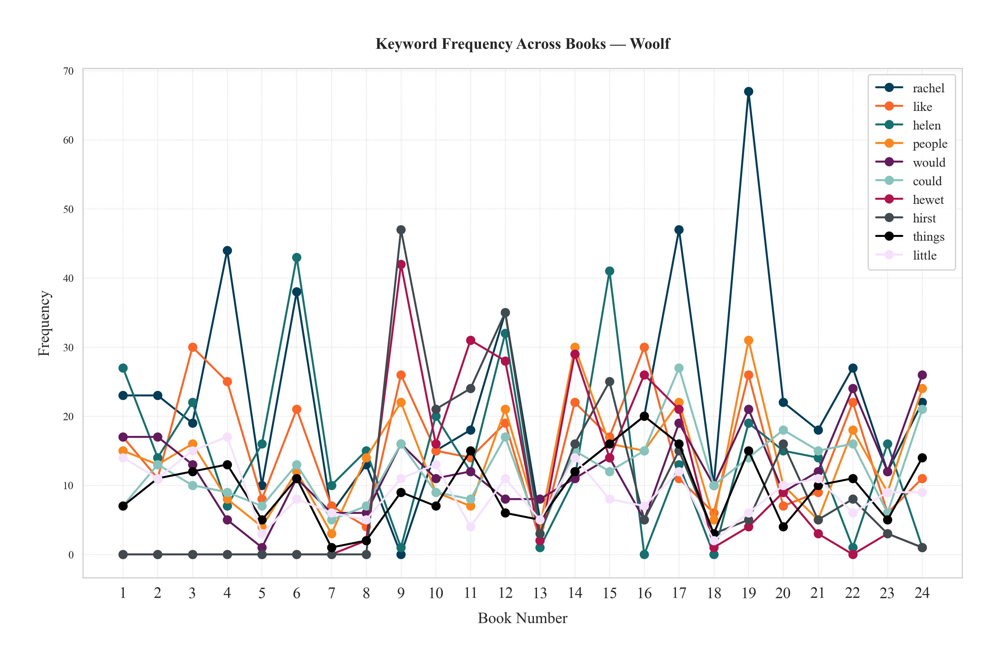

In [26]:
df_kw.plot(kind='line', figsize=(12, 7), marker='o')
plt.title(f'Keyword Frequency Across Books — {translator}')
plt.xlabel('Book Number', )
plt.ylabel('Frequency')
plt.xticks(ticks=range(1, 25), labels=range(1, 25))
plt.grid(alpha=0.4)
plt.savefig(f"/Users/debr/English-Homer/EDA_by_Author/{translator}_EDA/plots/{translator}-Keyword_Frequency.png")
plt.show()

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

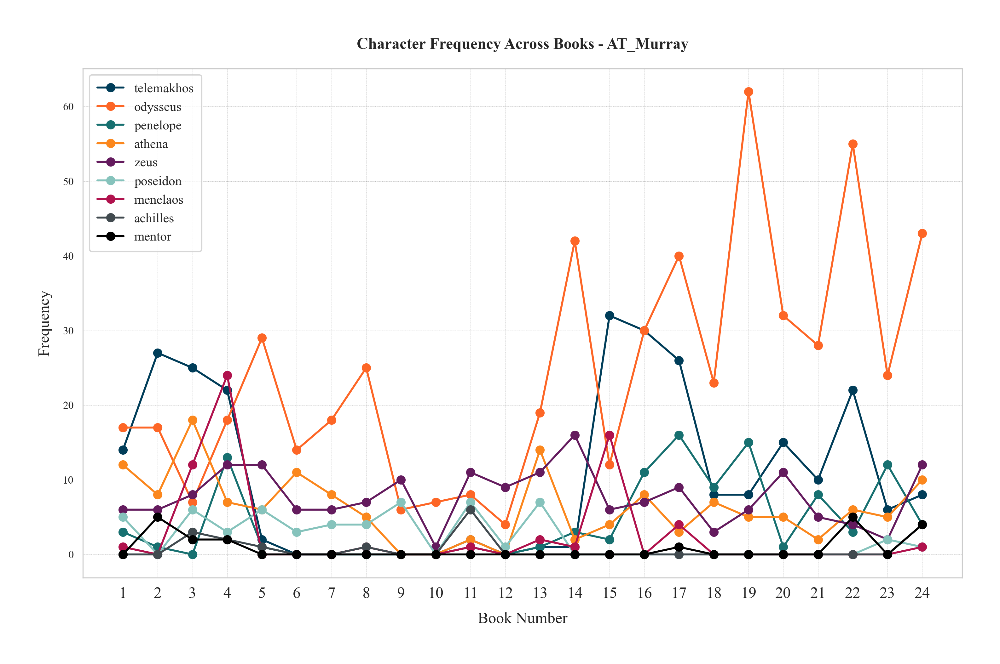

In [21]:
# Plot characters by relative freq 
characters = [ 'telemakhos', 'odysseus', 'penelope', 'athena', 'zeus', 'poseidon', 'menelaos', 'achilles', 'mentor' ]
df_char = count_keywords_by(df, by='book_num', keywords=characters)
df_char.plot(kind='line', figsize=(12, 7), marker='o')
plt.title(f'Character Frequency Across Books - {translator}')
plt.xlabel('Book Number')
plt.ylabel('Frequency')
plt.xticks(ticks=range(1, 25), labels=range(1, 25))
plt.grid(alpha=0.4)
plt.savefig(f"/Users/debr/English-Homer/EDA_by_Author/{translator}_EDA/plots/{translator}-Character_Frequency.png")
plt.show()

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

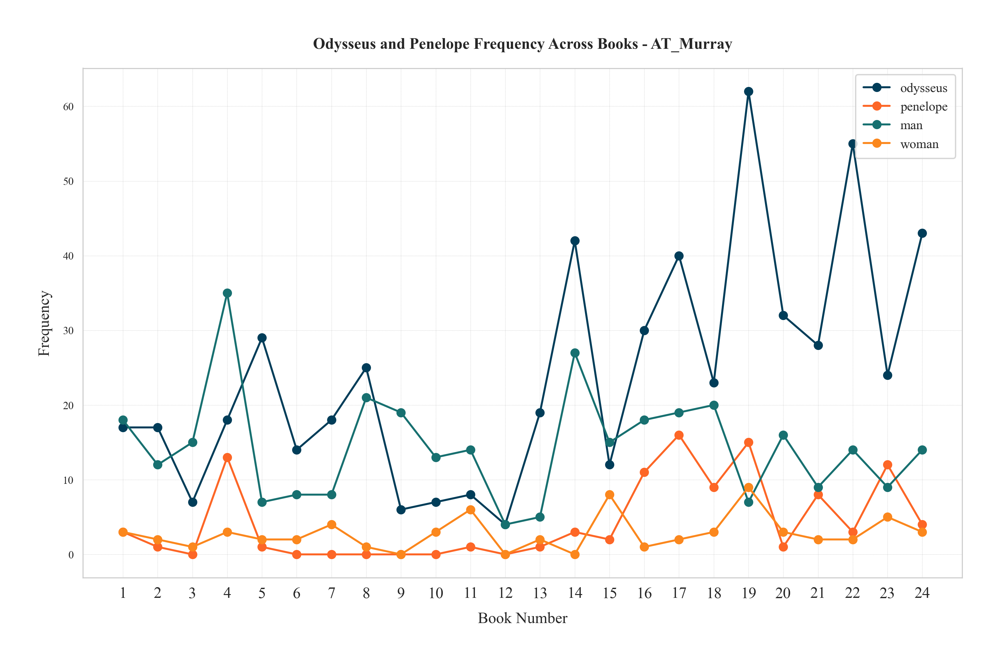

In [22]:
# Plot man-Odysseus by relative freq 
Ody_n_Pen = [ 'odysseus', 'penelope', 'man',  'woman' ]
df_char = count_keywords_by(df, by='book_num', keywords=Ody_n_Pen)
df_char.plot(kind='line', figsize=(12, 7), marker='o')
plt.title(f'Odysseus and Penelope Frequency Across Books - {translator}')
plt.xlabel('Book Number')
plt.ylabel('Frequency')
plt.xticks(ticks=range(1, 25), labels=range(1, 25))
plt.grid(alpha=0.4)
plt.savefig(f"/Users/debr/English-Homer/EDA_by_Author/{translator}_EDA/plots/{translator}-Odysseus_and_Penelope_lineplot.png")
plt.show()

As I suspected, **the alternation of man/Odysseus follows a patter**. Not only, I believe, Fagles switches between 'man' and 'Odysseus' but it builds the effect for the **anagnorisis**, in which Odysseus is revealed to be *the* man. Curiously, there is also a correlation between 'Penelope' and 'woman'.

### Heatmaps

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

Processing texts:   0%|          | 0/10 [00:00<?, ?it/s]

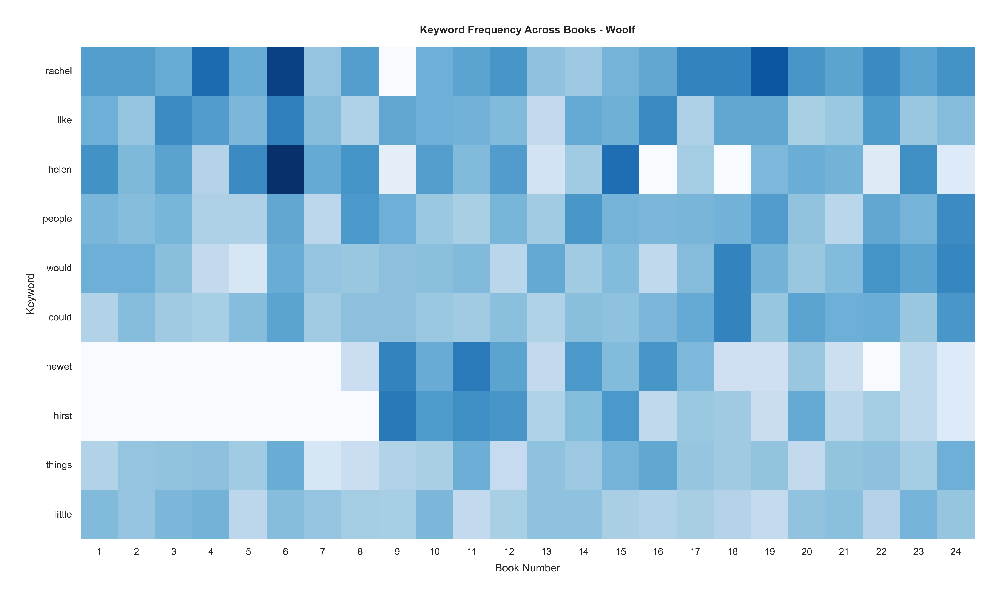

In [27]:
df_freqs = count_keywords_by(df, by='book_num', keywords=keywords)

# compute relative frequencies based on total number of tokens per year
df_freqs = df_freqs.div(df.groupby('book_num')['num_tokens'].sum(), axis=0)
# apply square root as sublinear filter for better contrast
df_freqs = df_freqs.progress_apply(np.sqrt)

plt.figure(figsize=(18, 10)) ###
sns.set(font_scale=1) ###
# dark  ax=axs[1], cmap='gray'
sns.heatmap(data=df_freqs.T, 
            xticklabels=True, yticklabels=True, cmap="Blues", cbar=False) # , cmap="Reds"

# rotate y labels
plt.yticks(rotation=0)
plt.title(f'Keyword Frequency Across Books - {translator}')
plt.xlabel('Book Number')
plt.ylabel('Keyword')
plt.savefig(f"{output_path_plots}/{translator}-Keyword_Frequency_Heatmap_blues.png")
plt.show()

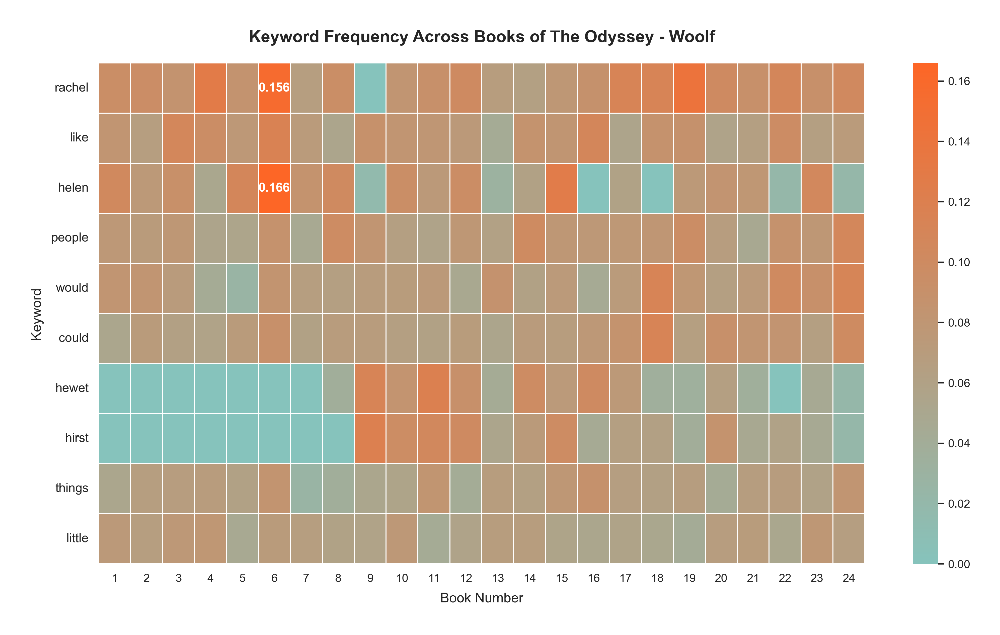

In [28]:
from matplotlib.colors import LinearSegmentedColormap

#keywords = list(df_freqs.index)  # Get keywords from the dataframe index
# Your custom color palette
neptune = '#86C3BC'
astroblue = '#FD6626' #'#003D59'
custom_colors = ['#003D59', '#FD6626', '#177070', '#FB871D', '#641B5E', '#86C3BC', '#F5E1FD', '#414A4F', 'k']

# Create custom colormap
custom_cmap = LinearSegmentedColormap.from_list('neptune_blue', [neptune, astroblue])

# Create figure
plt.figure(figsize=(14, 8))

# Create the heatmap with improved aesthetics
ax = sns.heatmap(
    data=df_freqs.T,
    vmin=0,
    vmax=df_freqs.values.max(),
    cmap=custom_cmap,
    xticklabels=True, 
    yticklabels=True,
    cbar=True,
    linewidths=0.5,
    linecolor='white'
)
plt.yticks(rotation=0, fontsize=12)
plt.xticks(fontsize=11)
plt.title(f'Keyword Frequency Across Books of The Odyssey - {translator}',fontsize=16, pad=20)
plt.xlabel('Book Number', fontsize=13)
plt.ylabel('Keyword', fontsize=13)

# Add annotations for highest frequency words
for i in range(len(keywords)):
    max_idx = df_freqs.T.iloc[i].argmax()
    max_val = df_freqs.T.iloc[i, max_idx]
    if max_val > df_freqs.values.max() * 0.8:  # Only annotate the most significant values
        ax.text(max_idx + 0.5, i + 0.5, f'{max_val:.3f}', 
                ha='center', va='center', color='white', fontweight='bold')

# Adjust layout
plt.tight_layout()
plt.savefig(f"{output_path_plots}/{translator}-Keyword_Frequency_Heatmap.png")
plt.show()

Processing texts:   0%|          | 0/24 [00:00<?, ?it/s]

Processing texts:   0%|          | 0/9 [00:00<?, ?it/s]

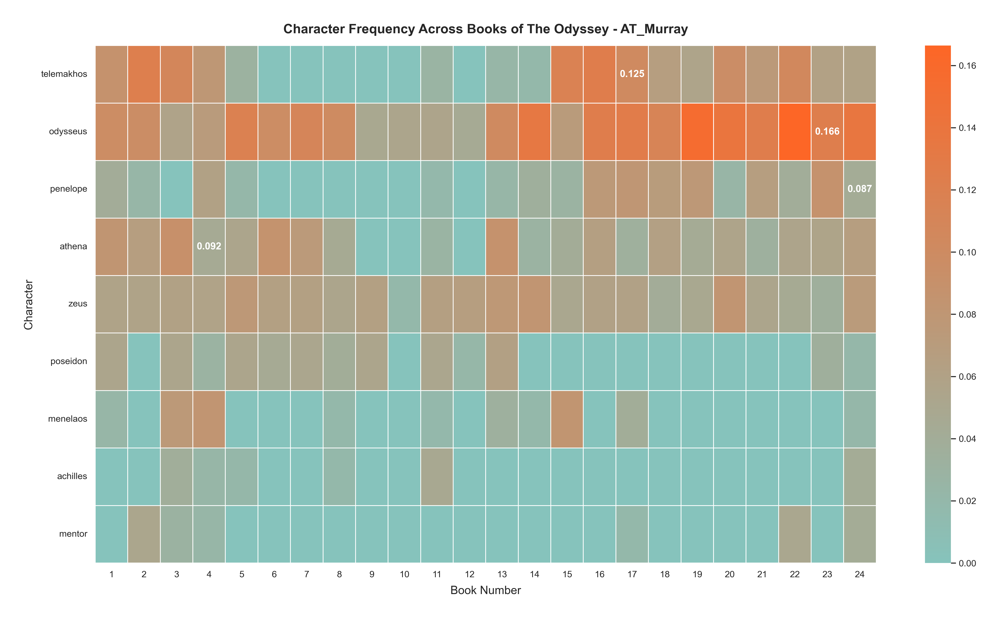

In [25]:
df_freqs = count_keywords_by(df, by='book_num', keywords=characters)
# compute relative frequencies based on total number of tokens per year
df_freqs = df_freqs.div(df.groupby('book_num')['num_tokens'].sum(), axis=0)
# apply square root as sublinear filter for better contrast
df_freqs = df_freqs.progress_apply(np.sqrt)

# Define color scheme
neptune = '#86C3BC'
astroblue = '#FD6626'  # orange instead of blue
custom_colors = ['#003D59', '#FD6626', '#177070', '#FB871D', '#641B5E', '#86C3BC', '#F5E1FD', '#414A4F', 'k']
# Create custom colormap
custom_cmap = LinearSegmentedColormap.from_list('neptune_orange', [neptune, astroblue])

# Create plot with custom dimensions
plt.figure(figsize=(18, 10))

# Create the heatmap with custom aesthetics
ax = sns.heatmap(
    data=df_freqs.T,
    vmin=0,
    vmax=df_freqs.values.max(),
    cmap=custom_cmap,
    xticklabels=True,
    yticklabels=True,
    cbar=True,
    linewidths=0.5,
    linecolor='white'
)

# Format labels and title
plt.yticks(rotation=0)
plt.title(f'Character Frequency Across Books of The Odyssey - {translator}', fontsize=16)
plt.xlabel('Book Number', fontsize=14)
plt.ylabel('Character', fontsize=14)

# Add annotations for highest frequency words
num_rows, num_cols = df_freqs.T.shape  # Transposed shape

for i in range(min(len(characters), num_rows)):  # Ensure within bounds
    max_idx = df_freqs.T.iloc[i].idxmax()  # Get column index of max value
    max_val = df_freqs.T.iloc[i].max()  # Get max value

    # Add annotation only for significant values
    if max_val > df_freqs.values.max() * 0.5:  
        ax.text(max_idx + 0.5, i + 0.5, f'{max_val:.3f}', 
                ha='center', va='center', color='white', fontweight='bold')

# Show the plot
plt.tight_layout()
plt.savefig(f"{output_path_plots}/{translator}-Character_Frequency_Heatmap.png")
plt.show()

### IDF

In [29]:
from collections import Counter
import numpy as np
import pandas as pd
from tqdm import tqdm

tqdm.pandas()

def compute_idf(df, column='tokens', preprocess=None, min_df=2):
    """Compute inverse document frequency (IDF) of tokens in a DataFrame."""
    
    def update(doc):
        if isinstance(doc, list):  # Ensure it's iterable
            tokens = doc if preprocess is None else preprocess(doc)
            counter.update(set(tokens))  # Count unique tokens in doc

    # Initialize counter and drop NaNs
    counter = Counter()
    df = df.dropna(subset=[column])  

    # Use apply instead of progress_map for reliability
    df[column].progress_apply(update)

    # Convert to DataFrame and compute IDF
    idf_df = pd.DataFrame.from_dict(counter, orient='index', columns=['df'])
    idf_df = idf_df.query('df >= @min_df')
    idf_df['idf'] = np.log(len(df) / (idf_df['df'] + 1)) + 0.1  # Prevent division by zero
    idf_df.index.name = 'token'
    
    return idf_df

idf_df = compute_idf(df)

100%|██████████| 24/24 [00:00<00:00, 2050.54it/s]
/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_3950/1647554092.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idf_df['idf'] = np.log(len(df) / (idf_df['df'] + 1)) + 0.1  # Prevent division by zero


In [27]:
idf_df.sort_values('idf', ascending=False).head(10)

,df,idf
token,,
vigor,2,2.179442
action,2,2.179442
sawn,2,2.179442
veins,2,2.179442
countries,2,2.179442
trap,2,2.179442
calves,2,2.179442
chieftains,2,2.179442
eurynomos,2,2.179442


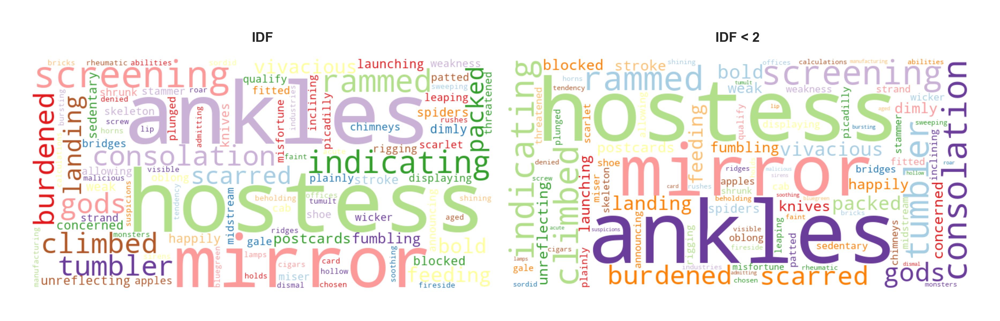

In [30]:
# high IDF means rare (interesting) term
plt.figure(figsize=(12, 4))
plt.subplot(1,2,1)###
wordcloud(idf_df['idf'], title='IDF', max_words=100)
plt.subplot(1,2,2)###
wordcloud(idf_df['idf'], title='IDF < 2', max_words=100, 
          stopwords=idf_df.query('idf < 2').index)
plt.tight_layout()###
plt.show()


In [31]:
idf_df


,df,idf
token,,
laughing,10,0.880159
elder,5,1.486294
see,22,0.142560
delicate,4,1.668616
hostess,2,2.179442
...,...,...
preferable,2,2.179442
diamonds,2,2.179442
islands,2,2.179442


In [32]:
# not in book: for more data: joining is faster
df_freqs = count_words(df)
df_freqs = df_freqs.join(idf_df)
df_freqs['tfidf'] = df_freqs['freq'] * df_freqs['idf']
df_freqs

100%|██████████| 24/24 [00:00<00:00, 2398.29it/s]


,freq,df,idf,tfidf
token,,,,
rachel,522,23.0,0.100000,52.200000
like,366,24.0,0.059178,21.659150
helen,351,22.0,0.142560,50.038425
people,333,24.0,0.059178,19.706276
would,294,24.0,0.059178,17.398334
...,...,...,...,...
seabirds,2,2.0,2.179442,4.358883
tempt,2,2.0,2.179442,4.358883
tremendous,2,2.0,2.179442,4.358883


100%|██████████| 1/1 [00:00<00:00, 1113.73it/s]


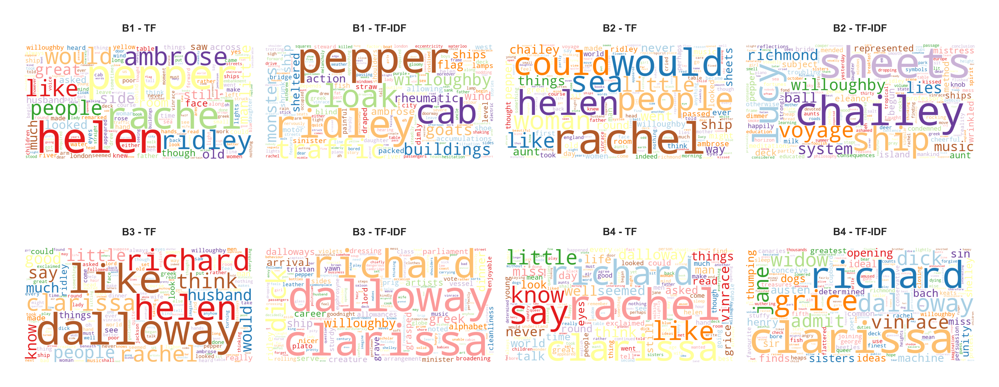

In [33]:
# Compute word frequencies for Books 1 to 4: The Telemachy
freq_1 = count_words(df[df['book_num'] == 1])
freq_2 = count_words(df[df['book_num'] == 2])
freq_3 = count_words(df[df['book_num'] == 3])  # Added Book 3
freq_4 = count_words(df[df['book_num'] == 4])  # Added Book 4

# Compute TF-IDF
freq_1['tfidf'] = freq_1['freq'] * idf_df['idf']
freq_2['tfidf'] = freq_2['freq'] * idf_df['idf']
freq_3['tfidf'] = freq_3['freq'] * idf_df['idf']  # Added Book 3
freq_4['tfidf'] = freq_4['freq'] * idf_df['idf']  # Added Book 4

# Set up a 2x4 grid for the subplots
plt.figure(figsize=(16, 8))  

# Book 1
plt.subplot(2, 4, 1)
wordcloud(freq_1['freq'], title='B1 - TF', stopwords=[''])
plt.subplot(2, 4, 2)
wordcloud(freq_1['tfidf'], title='B1 - TF-IDF', stopwords=[''])

# Book 2
plt.subplot(2, 4, 3)
wordcloud(freq_2['freq'], title='B2 - TF', stopwords=[''])
plt.subplot(2, 4, 4)
wordcloud(freq_2['tfidf'], title='B2 - TF-IDF', stopwords=[''])

# Book 3
plt.subplot(2, 4, 5)
wordcloud(freq_3['freq'], title='B3 - TF', stopwords=[''])
plt.subplot(2, 4, 6)
wordcloud(freq_3['tfidf'], title='B3 - TF-IDF', stopwords=[''])

# Book 4
plt.subplot(2, 4, 7)
wordcloud(freq_4['freq'], title='B4 - TF', stopwords=[''])
plt.subplot(2, 4, 8)
wordcloud(freq_4['tfidf'], title='B4 - TF-IDF', stopwords=[''])

# Adjust layout and save
plt.tight_layout()
plt.savefig(f"{output_path_plots}/{translator}-TF_TFIDF_wordcloud_Telemachy.png")
plt.show()

### Keyword Window

In [34]:
# From Blueprints for Text Analysis Using Python
# by Matthew Russell
# Published by O'Reilly Media, Inc., 2021
import textacy

if textacy.__version__ < '0.11': # as in printed book
    from textacy.text_utils import KWIC

else: # for textacy 0.11.x
    from textacy.extract.kwic import keyword_in_context

    def KWIC(*args, **kwargs):
        # call keyword_in_context with all params except 'print_only'
        return keyword_in_context(*args,
                           **{kw: arg for kw, arg in kwargs.items()
                            if kw != 'print_only'})

def kwic(doc_series, keyword, window=35, print_samples=5):

    def add_kwic(text):
        kwic_list.extend(KWIC(text, keyword, ignore_case=True,
                              window_width=window, print_only=False))

    kwic_list = []
    doc_series.progress_map(add_kwic)

    if print_samples is None or print_samples==0:
        return kwic_list
    else:
        k = min(print_samples, len(kwic_list))
        print(f"{k} random samples out of {len(kwic_list)} " + \
              f"contexts for '{keyword}':")
        for sample in random.sample(list(kwic_list), k):
            print(re.sub(r'[\n\t]', ' ', sample[0])+'  '+ \
                  sample[1]+'  '+\
                  re.sub(r'[\n\t]', ' ', sample[2]))

In [35]:
import random
random.seed(22)
keyword = 'spear'
kwic(df['text'], keyword, print_samples=10)


100%|██████████| 24/24 [00:00<00:00, 2356.90it/s]

7 random samples out of 7 contexts for 'spear':
er lies,  ,  “A grand fellow, Shake  spear  e,” he said, replacing the volume. 
its.  ,  “Shakespeare? I hate Shake  spear  e!” Mrs. Flushing exclaimed; and Wi
ghed.  ,  “You’re thinking of Shake  spear  e,” said Mr. Grice, and taking down
 eyes upon a thicket of  ,  native   spear  s which were so ingeniously arrange
,  people, I feel, among whom Shake  spear  e will be born if he is ever born  
now. What have you read? Just Shake  spear  e and the Bible?”  ,  “I haven’t re
s and prodigious fruits.  ,  “Shake  spear  e? I hate Shakespeare!” Mrs. Flushi


In [36]:
# Find keyword in a specific book
kwic(df[df['book_num'] == 5]['text'], 'water', print_samples=10)

100%|██████████| 1/1 [00:00<00:00, 892.79it/s]

2 random samples out of 2 contexts for 'water':
  ,  looked over the troubled grey   water  s, where the sunlight was fitfully 
hes, fallen off the  ,  chair; the   water   jug gleaming white; but the horror


## Bigrams

In [37]:
def ngrams(tokens, n=2, sep=' ', stopwords=set()):
    return [sep.join(ngram) for ngram in zip(*[tokens[i:] for i in range(n)])
            if len([t for t in ngram if t in stopwords])==0]

df['bigrams'] = df['tokens'].progress_apply(ngrams, n=2, stopwords=stopwords)

count_words(df, 'bigrams').head(30)

100%|██████████| 24/24 [00:00<00:00, 2767.22it/s]


,freq
token,
miss allan,75
st john,75
miss vinrace,31
young man,23
men women,22
young men,20
could see,20
great deal,18
side side,18


In [38]:
df['trigrams'] = df['tokens'].progress_apply(ngrams, n=3, stopwords=stopwords)
count_words(df, 'trigrams').head(30)

100%|██████████| 24/24 [00:00<00:00, 3833.19it/s]


,freq
token,
st john hirst,11
miss allan looked,4
sat side side,4
cambridge go bar,3
things people say,3
asked whether might,3
come see us,3
hundred years ago,3
drew deep breath,3


100%|██████████| 24/24 [00:00<00:00, 421.22it/s]
/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_3950/1647554092.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idf_df['idf'] = np.log(len(df) / (idf_df['df'] + 1)) + 0.1  # Prevent division by zero
100%|██████████| 24/24 [00:00<00:00, 4061.62it/s]
/var/folders/ry/hrln400n23ldv0p0lx1m14140000gn/T/ipykernel_3950/1647554092.py:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  idf_df['idf'] = np.log(len(df) / (idf_df['df'] + 1)) + 0.1  # Prevent 

No matching bigrams found for 'words'. Skipping word cloud.


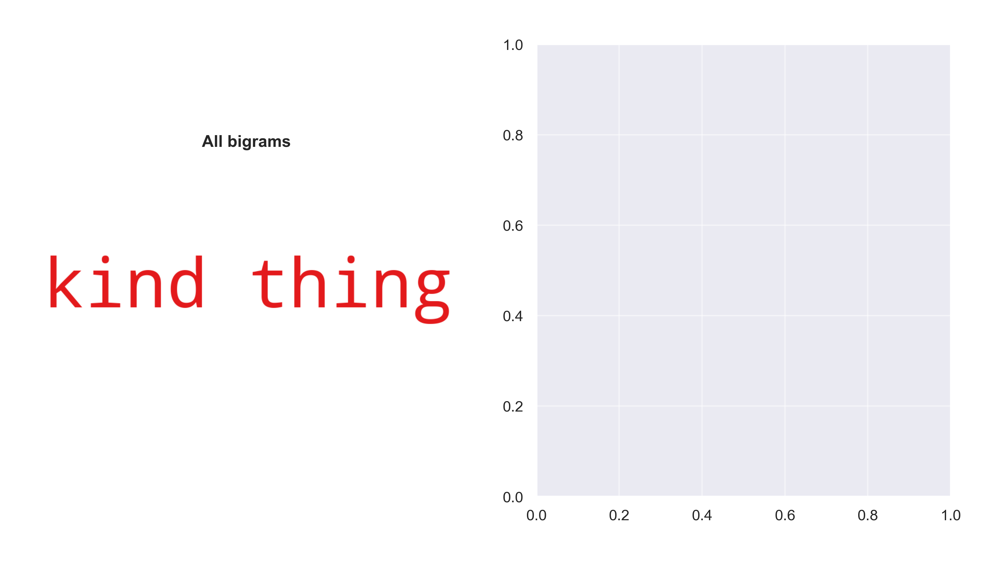

In [39]:
# Recompute IDF with bigrams
idf_df = compute_idf(df)  # Re-initialize to be safe
idf_df = pd.concat([idf_df, compute_idf(df, 'bigrams', min_df=10)])  # Concatenate bigram IDFs

# Compute bigram frequencies
df_freqs = count_words(df[df['book_num'] == 4], 'bigrams')
df_freqs['tfidf'] = df_freqs['freq'] * idf_df['idf']

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
wordcloud(df_freqs['tfidf'], title='All bigrams', max_words=50)
plt.subplot(1, 2, 2)
where = df_freqs.index.str.contains('words', case=False)

# Handle case where no matching bigrams exist
try:
    if df_freqs[where].empty:
        raise ValueError("No matching bigrams found for 'words'. Skipping word cloud.")
    wordcloud(df_freqs[where]['freq'], title='"words" bigrams', max_words=50)
except ValueError as e:
    print(e)

plt.savefig(f"{output_path_plots}/{translator}-TFIDF_bigrams.png")
plt.show()


In [40]:
df

,author,year,title,book_num,text,num_lines,num_sentences,num_words,tokens,num_tokens,scaled_num_words,scaled_num_sentences,scaled_num_lines,bigrams,trigrams
0,Woolf,1915,The Voyage Out,1,As the streets that lead from the Strand to th...,486,355,5324,"[streets, lead, strand, embankment, narrow, be...",2541,0.166968,0.117632,0.319081,"[streets lead, lead strand, strand embankment,...","[streets lead strand, lead strand embankment, ..."
1,Woolf,1915,The Voyage Out,2,"Uncomfortable as the night, with its rocking m...",457,264,5430,"[uncomfortable, night, rocking, movement, salt...",2516,0.229609,-0.521445,0.122897,"[uncomfortable night, night rocking, rocking m...","[uncomfortable night rocking, night rocking mo..."
2,Woolf,1915,The Voyage Out,3,Early next morning there was a sound as of cha...,514,428,5751,"[early, next, morning, sound, chains, drawn, r...",2603,0.419304,0.630299,0.508500,"[early next, next morning, morning sound, soun...","[early next morning, next morning sound, morni..."
3,Woolf,1915,The Voyage Out,4,Next morning Clarissa was up before anyone els...,550,520,5983,"[next, morning, clarissa, anyone, else, dresse...",2691,0.556405,1.276399,0.752038,"[next morning, morning clarissa, clarissa anyo...","[next morning clarissa, morning clarissa anyon..."
4,Woolf,1915,The Voyage Out,5,She was not able to follow up her observations...,265,280,2920,"[able, follow, observations, however, come, co...",1370,-1.253678,-0.409080,-1.175976,"[able follow, follow observations, observation...","[able follow observations, follow observations..."
5,Woolf,1915,The Voyage Out,6,“That’s the tragedy of life—as I always say!” ...,321,249,3494,"[tragedy, life, always, say, dalloway, beginni...",1562,-0.914472,-0.626788,-0.797138,"[tragedy life, life always, always say, say da...","[tragedy life always, life always say, always ..."
6,Woolf,1915,The Voyage Out,7,From a distance the _Euphrosyne_ looked very s...,238,126,2724,"[distance, euphrosyne, looked, small, glasses,...",1351,-1.369504,-1.490596,-1.358630,"[distance euphrosyne, euphrosyne looked, looke...","[distance euphrosyne looked, euphrosyne looked..."
7,Woolf,1915,The Voyage Out,8,"The next few months passed away, as many years...",269,176,3038,"[next, months, passed, away, many, years, pass...",1433,-1.183946,-1.139454,-1.148916,"[next months, months passed, passed away, away...","[next months passed, months passed away, passe..."
8,Woolf,1915,The Voyage Out,9,"An hour passed, and the downstairs rooms at th...",647,627,7105,"[hour, passed, downstairs, rooms, hotel, grew,...",3296,1.219452,2.027842,1.408240,"[hour passed, passed downstairs, downstairs ro...","[hour passed downstairs, passed downstairs roo..."
9,Woolf,1915,The Voyage Out,10,Among the promises which Mrs. Ambrose had made...,430,322,4862,"[among, promises, ambrose, made, niece, stay, ...",2230,-0.106051,-0.114121,-0.059757,"[among promises, promises ambrose, ambrose mad...","[among promises ambrose, promises ambrose made..."


In [41]:
print(df['text'][0])

As the streets that lead from the Strand to the Embankment are very  ,  narrow, it is better not to walk down them arm-in-arm. If you persist,  ,  lawyers’ clerks will have to make flying leaps into the mud; young lady  ,  typists will have to fidget behind you. In the streets of London where  ,  beauty goes unregarded, eccentricity must pay the penalty, and it is  ,  better not to be very tall, to wear a long blue cloak, or to beat the  ,  air with your left hand.  ,  One afternoon in the beginning of October when the traffic was becoming  ,  brisk a tall man strode along the edge of the pavement with a lady on  ,  his arm. Angry glances struck upon their backs. The small, agitated  ,  figures—for in comparison with this couple most people looked  ,  small—decorated with fountain pens, and burdened with despatch-boxes,  ,  had appointments to keep, and drew a weekly salary, so that there was  ,  some reason for the unfriendly stare which was bestowed upon Mr.  ,  Ambrose’s height and 

In [42]:
df

,author,year,title,book_num,text,num_lines,num_sentences,num_words,tokens,num_tokens,scaled_num_words,scaled_num_sentences,scaled_num_lines,bigrams,trigrams
0,Woolf,1915,The Voyage Out,1,As the streets that lead from the Strand to th...,486,355,5324,"[streets, lead, strand, embankment, narrow, be...",2541,0.166968,0.117632,0.319081,"[streets lead, lead strand, strand embankment,...","[streets lead strand, lead strand embankment, ..."
1,Woolf,1915,The Voyage Out,2,"Uncomfortable as the night, with its rocking m...",457,264,5430,"[uncomfortable, night, rocking, movement, salt...",2516,0.229609,-0.521445,0.122897,"[uncomfortable night, night rocking, rocking m...","[uncomfortable night rocking, night rocking mo..."
2,Woolf,1915,The Voyage Out,3,Early next morning there was a sound as of cha...,514,428,5751,"[early, next, morning, sound, chains, drawn, r...",2603,0.419304,0.630299,0.508500,"[early next, next morning, morning sound, soun...","[early next morning, next morning sound, morni..."
3,Woolf,1915,The Voyage Out,4,Next morning Clarissa was up before anyone els...,550,520,5983,"[next, morning, clarissa, anyone, else, dresse...",2691,0.556405,1.276399,0.752038,"[next morning, morning clarissa, clarissa anyo...","[next morning clarissa, morning clarissa anyon..."
4,Woolf,1915,The Voyage Out,5,She was not able to follow up her observations...,265,280,2920,"[able, follow, observations, however, come, co...",1370,-1.253678,-0.409080,-1.175976,"[able follow, follow observations, observation...","[able follow observations, follow observations..."
5,Woolf,1915,The Voyage Out,6,“That’s the tragedy of life—as I always say!” ...,321,249,3494,"[tragedy, life, always, say, dalloway, beginni...",1562,-0.914472,-0.626788,-0.797138,"[tragedy life, life always, always say, say da...","[tragedy life always, life always say, always ..."
6,Woolf,1915,The Voyage Out,7,From a distance the _Euphrosyne_ looked very s...,238,126,2724,"[distance, euphrosyne, looked, small, glasses,...",1351,-1.369504,-1.490596,-1.358630,"[distance euphrosyne, euphrosyne looked, looke...","[distance euphrosyne looked, euphrosyne looked..."
7,Woolf,1915,The Voyage Out,8,"The next few months passed away, as many years...",269,176,3038,"[next, months, passed, away, many, years, pass...",1433,-1.183946,-1.139454,-1.148916,"[next months, months passed, passed away, away...","[next months passed, months passed away, passe..."
8,Woolf,1915,The Voyage Out,9,"An hour passed, and the downstairs rooms at th...",647,627,7105,"[hour, passed, downstairs, rooms, hotel, grew,...",3296,1.219452,2.027842,1.408240,"[hour passed, passed downstairs, downstairs ro...","[hour passed downstairs, passed downstairs roo..."
9,Woolf,1915,The Voyage Out,10,Among the promises which Mrs. Ambrose had made...,430,322,4862,"[among, promises, ambrose, made, niece, stay, ...",2230,-0.106051,-0.114121,-0.059757,"[among promises, promises ambrose, ambrose mad...","[among promises ambrose, promises ambrose made..."


In [43]:
# save the dataframe
df.to_csv(f'/Users/debr/odysseys_en/Odyssey_dfs/Odyssey_{translator}_eda_END.csv', index=False)

## Tree Words